# 1D linearized MHD with a uniform background magnetic field
This script simulates MHD waves in a homogeneous plasma in a uniform background field $\textbf{B}=(B_x,B_y,B_z)$

Using the linearized ideal MHD equations with variations only in x-direction one obtains a system for the perturbed quantities $\textbf{U}=(u_{1x},u_{1y},u_{1z},B_{1x},B_{1y},B_{1z},\rho_1,p_1)$ which can be written in the compact form

\begin{align}
\partial_t \textbf{U}(t,x)+A\partial_x\textbf{U}(t,x)=0,
\end{align}

with some initial condition $\textbf{U}(0,x)$ and appropriate boundary conditions.
The matrix $A$ is

\begin{align}
A=
\begin{pmatrix}
0 &0 &0 &0 &B_{0y}/\rho_0 &B_{0z}/\rho_0 &0 &1/(2\rho_0) \\
0 &0 &0 &0 &-B_{0x}/\rho_0 &0 &0 &0 \\
0 &0 &0 &0 &0 &-B_{0x}/\rho_0 &0 &0 \\
0 &0 &0 &0 &0 &0 &0 &0 \\
B_{0y} &-B_{0x} &0 &0 &0 &0 &0 &0 \\
B_{0z} &0 &-B_{0x} &0 &0 &0 &0 &0 \\
\rho_0 &0 &0 &0 &0 &0 &0 &0 \\
\gamma p_0 &0 &0 &0 &0 &0 &0 &0 
\end{pmatrix}.
\end{align}

Several numerical schemes are implemented: 

For periodic boundary conditions $\textbf{U}(t,-L)=\textbf{U}(t,L)$:
explicit upwind scheme, implicit upwind scheme, Lax-Wendroff scheme, Lax-Friedrichs scheme, Leapfrog scheme (all Finite Differences), a Fourier spectral scheme and B-spline Finite Elements.

For Dirichlet boundary conditions $\textbf{U}(t,-L)=d_L(t), \textbf{U}(t,L)=d_R(t)$:
Lax-Wendroff scheme.

For Neumann boundary conditions $\partial_x\textbf{U}(t,-L)=n_L(t), \partial_x\textbf{U}(t,L)=n_R(t)$: 
Lax-Wendroff scheme.

Number of time steps: 400
Time steps finished: 0
Time steps finished: 100
Time steps finished: 200
Time steps finished: 300
Time integration finished!
Start to prepare animation!
Number of frames: 100
Frames finished: 0
Frames finished: 50



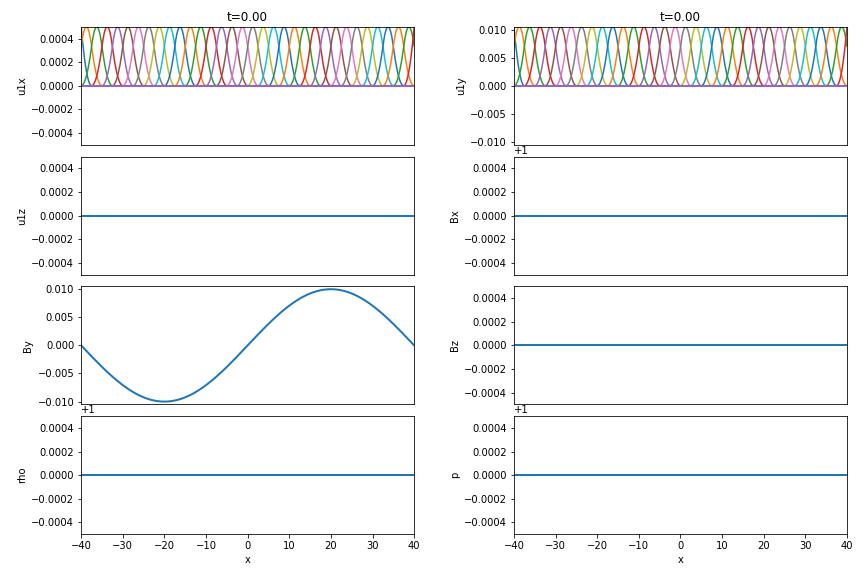
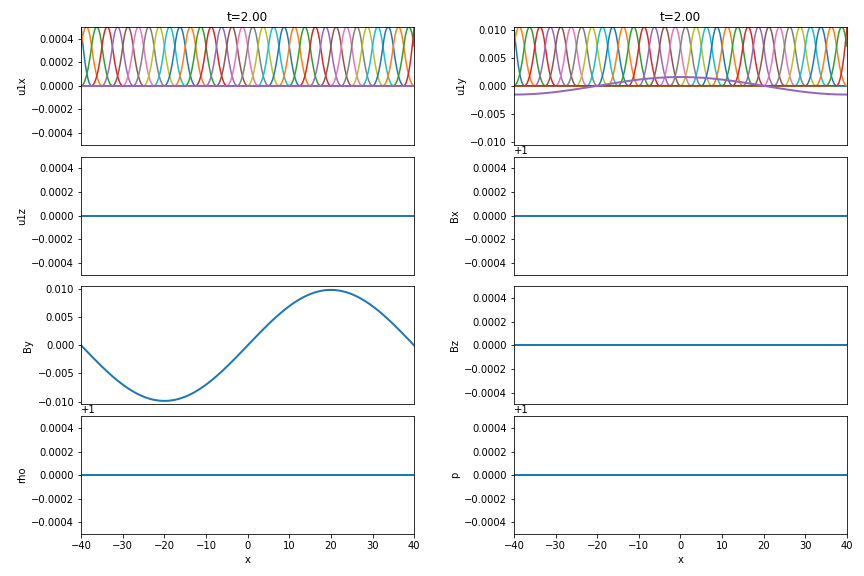
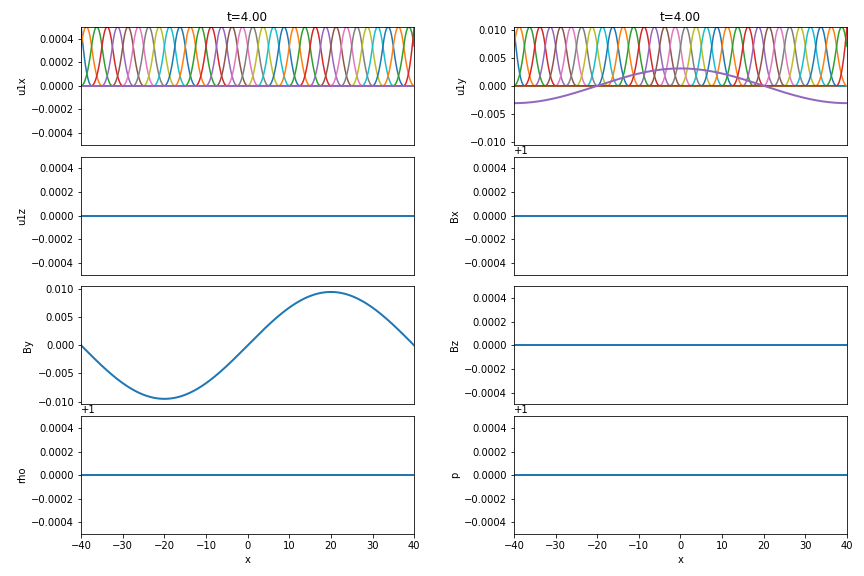
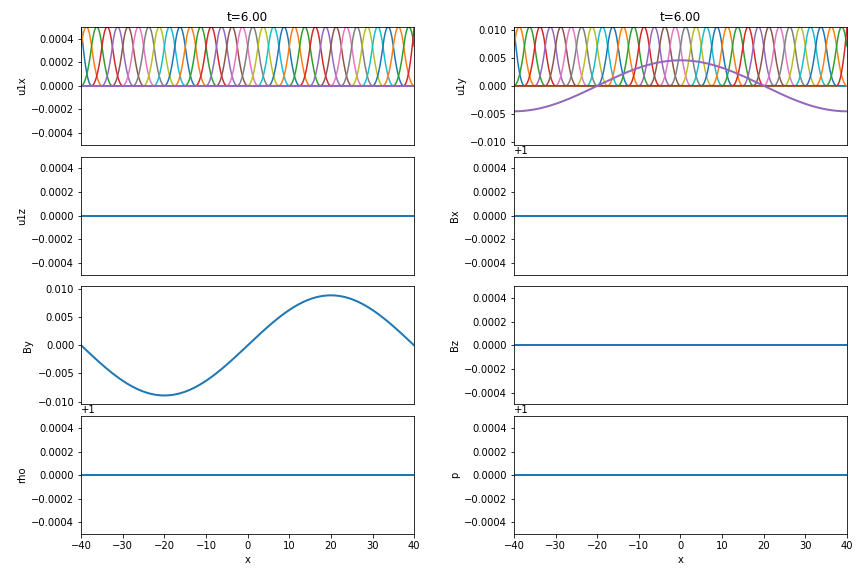
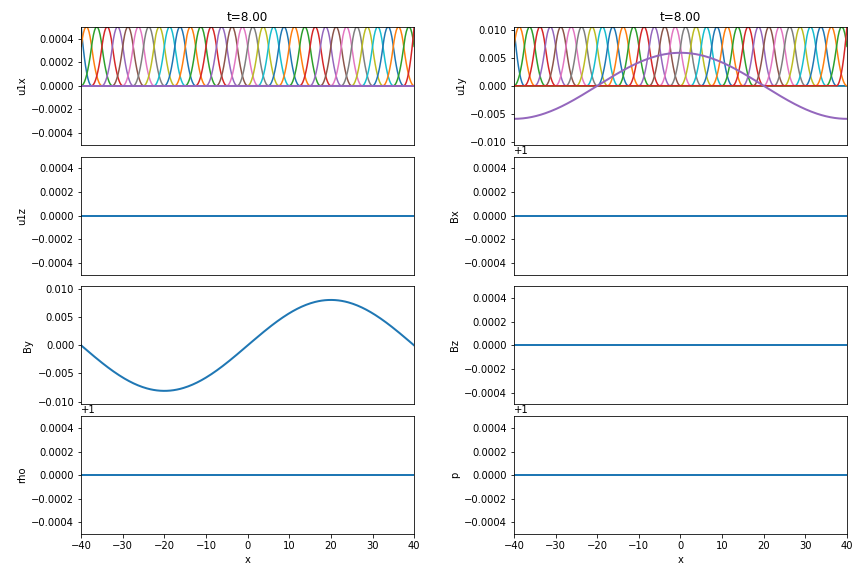
...
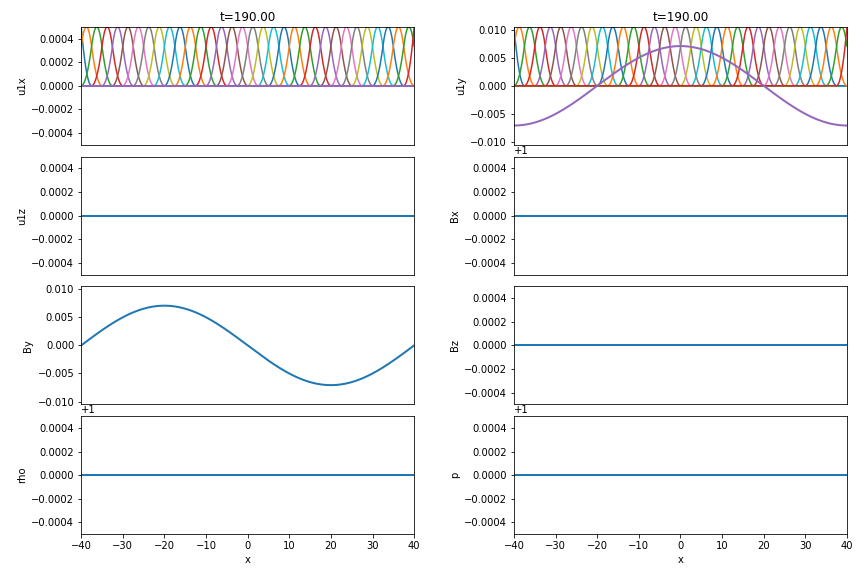
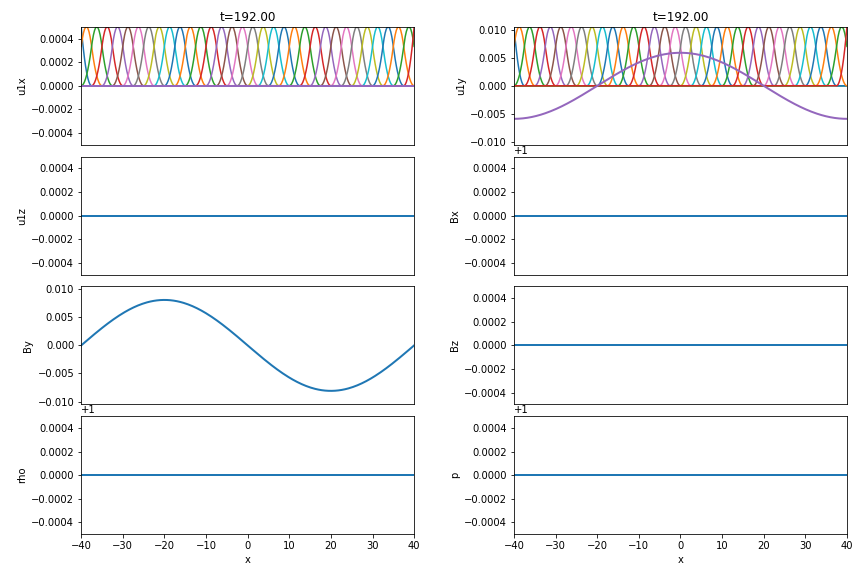
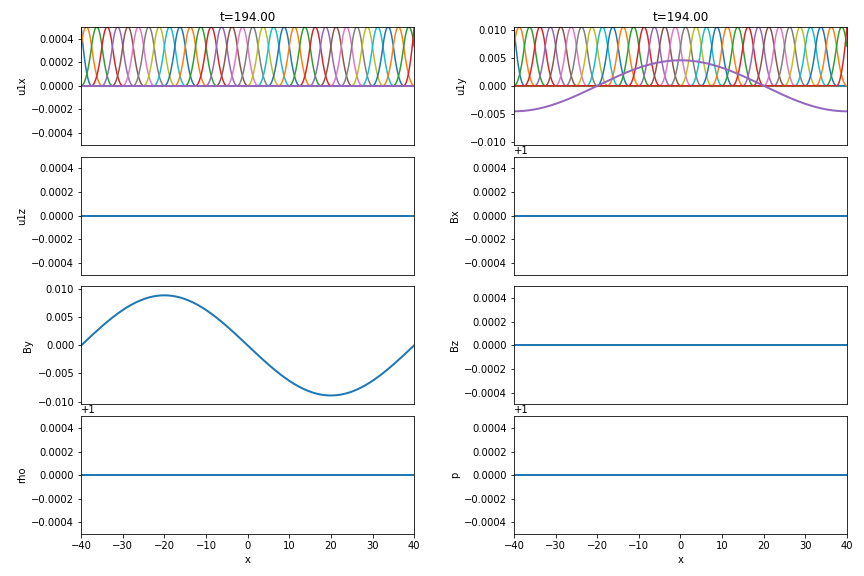
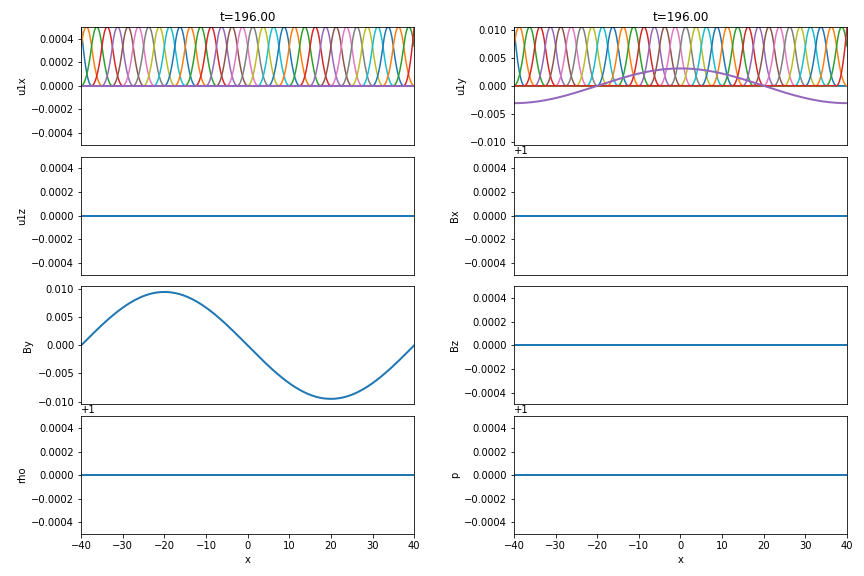
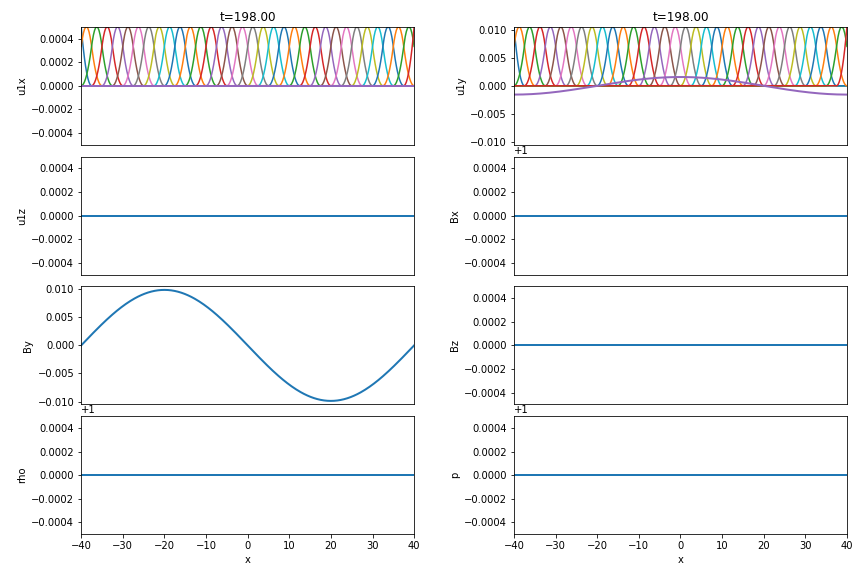

In [8]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from JSAnimation import IPython_display
from matplotlib import animation
from scipy.linalg import block_diag
from numpy.linalg import inv
from numpy import linalg as LA
from scipy.linalg import expm, sinm, cosm
from bsplines import Bspline
from bsplines import CardinalBspline
from bsplines import UniformBspline
from scipy.linalg import circulant
from scipy.integrate import odeint




# Author: Florian Holderied (Max-Planck-Institut für Plasmaphysik, Garching, Germany)
# Last update: 10.04.2018




# General input parameters
rho0 = 1                          # Mass density of plasma
p0 = 1                            # Pressure of plasma
B0x = 1                           # Background magnetic field x
B0y = 0                           # Background magnetic field y
B0z = 0                           # Background magnetic field z
gamma = 5/3                       # Adiabatic exponent
a = 0.01                          # Amplitude of largest initial pertubation
L = 40                            # Length of x-domain in + and - direction (L_tot = 2L)
T = 200                           # Simulation time


# Numerical input parameters
method = 'FiniteElements'         # Choose your numerical method (ExplicitUpwind, ImplicitUpwind, LaxWendroffPeriodic, LaxWendroffDirichlet, LaxWendroffNeumann, LaxFriedrichs, FourierSpectral, Leapfrog, FiniteElements)
Nx = 32                           # Number of grid cells in x-direction (or number of elements if Finite Element method is choosen)
CFL = 0.2                         # CFL-condition (determines time step, must be <= 1 for explicit Finite Difference schemes)
p = 2                             # Degree of B-splines (only for Finite Elements)
tinteg = 1                        # Time integration scheme (only for Finite Flements, 1: analytically with exponential matrix, 2: ODE solver odeint)
nx = 300                          # Number of x-points for plot (only for Finite Elements since the solution can be evaluated everywhere)
showBsplines = 'on'               # If you want to plot the B-spline basis put 'on' here (only relevant for Finite Elements) 



# Input parameters for initial condition
ini = 'off'                       # If you want the same shape for every initial condition, put 'on' here 
shape = 1                         # Shape of initial condition (1: sine-shaped, 2: 1/cosh-shaped, 3: Gauss-shaped)

# Input parameters for animation 
fr = 4                            # Plot only every "fr-th" time step in animation



# Initial conditions (put here the initial functions u(0,x))
def ICon(x):
    if ini == 'on': 
        if shape == 1:
            return np.outer(U0,np.sin(np.pi*x/L))
        elif shape == 2:
            return np.outer(U0,1/np.cosh(40*x/L))
        elif shape == 3:
            return np.outer(U0,np.exp(-x**2/10))          
    else:
        u1x_0 = 0*x
        u1y_0 = 0*x
        u1z_0 = 0*x
        B1x_0 = 0*x
        B1y_0 = a*np.sin(np.pi*x/L)
        B1z_0 = 0*x
        rho1_0 = 0*x
        p1_0 = 0*x
        IC = np.array([u1x_0,u1y_0,u1z_0,B1x_0,B1y_0,B1z_0,rho1_0,p1_0])
        return a/abs(IC).max()*IC



    
    
# Dirichlet boundary conditions (assign as many boundary conditions on the LHS (RHS) as positive (negative) eigenvalues of A)    
# LHS (put here the boundary conditions u(t,-L))
def d_L(t):
    u1x_L = 0*t
    u1y_L = 0*t
    u1z_L = 0*t
    B1x_L = 0*t
    B1y_L = 0.5*a*np.sin(0.2*t)**2*np.cos(0.5*t)
    B1z_L = 0*t
    rho1_L = 0*t
    p1_L = 0*t
    dL = np.array([u1x_L,u1y_L,u1z_L,B1x_L,B1y_L,B1z_L,rho1_L,p1_L])
    return dL
    
# RHS (put here the boundary conditions u(t,L))
def d_R(t):
    u1x_R = 0*t
    u1y_R = -2*a*np.sin(0.5*t)*B0x/rho0*np.pi/L
    u1z_R = 0*t
    B1x_R = 0*t
    B1y_R = 0*t
    B1z_R = 0*t
    rho1_R = 0*t
    p1_R = 0*t
    dR = np.array([u1x_R,u1y_R,u1z_R,B1x_R,B1y_R,B1z_R,rho1_R,p1_R])
    return dR
    
BL1_D = np.diag([0,0,0,0,1,0,0,0])
BL2_D = np.diag([1,1,1,1,0,1,1,1])
BR1_D = np.diag([0,1,0,0,0,0,0,0])
BR2_D = np.diag([1,0,1,1,1,1,1,1])
    
    
    
    

    
    
# Neumann boundary conditions (assign as many boundary conditions on the LHS (RHS) as positive (negative) eigenvalues of A)    
# LHS (put here the boundary conditions dx_u(t,-L))
def n_L(t):
    dx_u1x_L = 0*t
    dx_u1y_L = 0*t
    dx_u1z_L = 0*t
    dx_B1x_L = 0*t
    dx_B1y_L = -a*np.pi/L*np.cos(0.5*t)
    dx_B1z_L = 0*t
    dx_rho1_L = 0*t
    dx_p1_L = 0*t
    nL = np.array([dx_u1x_L,dx_u1y_L,dx_u1z_L,dx_B1x_L,dx_B1y_L,dx_B1z_L,dx_rho1_L,dx_p1_L])
    return nL
    
# RHS (put here the boundary conditions dx_u(t,L))
def n_R(t):
    dx_u1x_R = 0*t
    dx_u1y_R = 0.5*a*np.sin(0.2*t)**2*np.cos(0.5*t)
    dx_u1z_R = 0*t
    dx_B1x_R = 0*t
    dx_B1y_R = 0*t
    dx_B1z_R = 0*t
    dx_rho1_R = 0*t
    dx_p1_R = 0*t
    nR = np.array([dx_u1x_R,dx_u1y_R,dx_u1z_R,dx_B1x_R,dx_B1y_R,dx_B1z_R,dx_rho1_R,dx_p1_R])
    return nR
    
BL1_N = np.diag([0,0,0,0,1,0,0,0])
BL2_N = np.diag([1,1,1,1,0,1,1,1])
BR1_N = np.diag([0,1,0,0,0,0,0,0])
BR2_N = np.diag([1,0,1,1,1,1,1,1])    
    



    

    
    
# System matrix
A0 = np.array([0,0,0,0,B0y/rho0,B0z/rho0,0,1/(2*rho0)])
A1 = np.array([0,0,0,0,-B0x/rho0,0,0,0])                
A2 = np.array([0,0,0,0,0,-B0x/rho0,0,0])                
A3 = np.array([0,0,0,0,0,0,0,0])                
A4 = np.array([B0y,-B0x,0,0,0,0,0,0])                
A5 = np.array([B0z,0,-B0x,0,0,0,0,0])                
A6 = np.array([rho0,0,0,0,0,0,0,0])                
A7 = np.array([p0*gamma,0,0,0,0,0,0,0])              
A = np.array([A0,A1,A2,A3,A4,A5,A6,A7])



# Eigenvalues (characteristic velocities of the system) and eigenvectors
v,w = LA.eig(A)


# Initial conditions
if ini == 'on':
    indicespos = np.array([])
    indicesneg = np.array([])
    for i in range(0,v.size):
        if v[i] > 0:
            indicespos = np.append(indicespos,i)
        elif v[i] < 0:
            indicesneg = np.append(indicesneg,i)  
        
    print('Positive advection speed:' + str(indicespos))
    print('Negative advection speed:' + str(indicesneg))
    initial = int(input("Choose your initial condition: ")) 
    U0 = a*w[:,initial]/np.amax(abs(w[:,initial]))
    temp = np.zeros(v.size)
    temp[initial] = v[initial]
    v = temp
            
            
            
                       
# Discretisation of space and time
deltax = 2*L/Nx
deltat = CFL*deltax/np.abs(v.max())
Nt = np.int(T/deltat)
T = Nt*deltat
x = np.linspace(-L,L,Nx+1)
t = np.linspace(0,T,Nt+1)
print('Number of time steps: '+ str(Nt))    


    
       

        

        
        
        
# Explicit upwind scheme with matrix notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and periodic boundary conditions
def explicit_Upwind():
    s = int(np.sqrt(A.size))
    U = np.zeros((Nx,s,Nt+1))
    U[:,:,0] = np.transpose(ICon(x[0:Nx]))
    U = np.reshape(U,(s*Nx,Nt+1))
    
    vpos = np.array([])
    vneg = np.array([])
    Dpos = np.zeros((s,s))
    Dneg = np.zeros((s,s))
    
    for i in range(0,v.size):
        if v[i] > 0:
            Dpos[i,i] = v[i]
        elif v[i] < 0:
            Dneg[i,i] = v[i]
    
    Apos = np.dot(np.dot(w,Dpos),inv(w))
    Aneg = np.dot(np.dot(w,Dneg),inv(w))
    

    Temp1 = np.zeros((s*Nx,s*Nx))
    Temp2 = np.zeros((s*Nx,s*Nx))
    B1 = np.identity(s) - deltat/deltax*Apos + deltat/deltax*Aneg
    B2 = -deltat/deltax*Aneg
    B3 = deltat/deltax*Apos
    
    F1 = block_diag(*([B1]*Nx))
    F2 = block_diag(*([B2]*(Nx-1))) 
    F3 = block_diag(*([B3]*(Nx-1))) 
    Temp1[0:s*Nx-s,s:s*Nx] = F2  
    Temp2[s:s*Nx,0:s*Nx-s] = F3
    Temp2[s*Nx-s:s*Nx,0:s] = B2
    Temp2[0:s,s*Nx-s:s*Nx] = B3
    Tr = F1 + Temp1 + Temp2
    
    for n in range(0,U[0,:].size-1):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        U[:,n+1] = np.dot(Tr,U[:,n])
               
    Temp = np.zeros((s*Nx+s,Nt+1))
    Temp[0:s*Nx,:] = U
    Temp[s*Nx:s*Nx+s] = U[0:s,:]
    Temp = np.reshape(Temp,(Nx+1,s,Nt+1))
    
    P = np.zeros((Nx+1,s,Nt+1))
    P[:,0,:] = Temp[:,0,:]
    P[:,1,:] = Temp[:,1,:]
    P[:,2,:] = Temp[:,2,:]
    P[:,3,:] = Temp[:,3,:] + B0x
    P[:,4,:] = Temp[:,4,:] + B0y
    P[:,5,:] = Temp[:,5,:] + B0z
    P[:,6,:] = Temp[:,6,:] + rho0
    P[:,7,:] = Temp[:,7,:] + p0
    print('Time integration finished!')
    return P









# Implicit upwind scheme with matrix notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and periodic boundary conditions
def implicit_Upwind():
    s = int(np.sqrt(A.size))
    U = np.zeros((Nx,s,Nt+1))
    U[:,:,0] = np.transpose(ICon(x[0:Nx]))
    U = np.reshape(U,(s*Nx,Nt+1))
    
    vpos = np.array([])
    vneg = np.array([])
    Dpos = np.zeros((s,s))
    Dneg = np.zeros((s,s))
    
    for i in range(0,v.size):
        if v[i] > 0:
            Dpos[i,i] = v[i]
        elif v[i] < 0:
            Dneg[i,i] = v[i]
    
    Apos = np.dot(np.dot(w,Dpos),inv(w))
    Aneg = np.dot(np.dot(w,Dneg),inv(w))
    

    Temp1 = np.zeros((s*Nx,s*Nx))
    Temp2 = np.zeros((s*Nx,s*Nx))
    B1 = np.identity(s) + deltat/deltax*Apos - deltat/deltax*Aneg
    B2 = deltat/deltax*Aneg
    B3 = -deltat/deltax*Apos
    
    F1 = block_diag(*([B1]*Nx))
    F2 = block_diag(*([B2]*(Nx-1))) 
    F3 = block_diag(*([B3]*(Nx-1))) 
    Temp1[0:s*Nx-s,s:s*Nx] = F2  
    Temp2[s:s*Nx,0:s*Nx-s] = F3
    Temp2[s*Nx-s:s*Nx,0:s] = B2
    Temp2[0:s,s*Nx-s:s*Nx] = B3
    Tr = F1 + Temp1 + Temp2
    ID = np.identity(s)
    
    for n in range(0,Nx-1):
        Temp1 = np.identity(s)
        ID = np.append(ID,Temp1,axis=0)
    
    ID = np.transpose(ID)
    Tr[s*Nx-s:s*Nx,:] = ID
    invTr = inv(Tr)
    
    for n in range(0,U[0,:].size-1):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        Temp2 = np.zeros(s*Nx+1)
        Temp2[0:s*Nx] = U[:,n]
        Temp2[s*Nx-s:s*Nx] = 0
        Temp2 = np.delete(Temp2,-1)
        U[:,n+1] = np.dot(invTr,U[:,n])
               
    Temp = np.zeros((s*Nx+s,Nt+1))
    Temp[0:s*Nx,:] = U
    Temp[s*Nx:s*Nx+s] = U[0:s,:]
    Temp = np.reshape(Temp,(Nx+1,s,Nt+1))
    
    P = np.zeros((Nx+1,s,Nt+1))
    P[:,0,:] = Temp[:,0,:]
    P[:,1,:] = Temp[:,1,:]
    P[:,2,:] = Temp[:,2,:]
    P[:,3,:] = Temp[:,3,:] + B0x
    P[:,4,:] = Temp[:,4,:] + B0y
    P[:,5,:] = Temp[:,5,:] + B0z
    P[:,6,:] = Temp[:,6,:] + rho0
    P[:,7,:] = Temp[:,7,:] + p0
    print('Time integration finished!')
    return P








# Lax-Friedrichs scheme with matrix notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and periodic boundary conditions
def Lax_Friedrichs():
    s = int(np.sqrt(A.size))
    U = np.zeros((Nx,s,Nt+1))
    U[:,:,0] = np.transpose(ICon(x[0:Nx]))
    U = np.reshape(U,(s*Nx,Nt+1))
    
    B = deltat/(2*deltax)*A
    B1 = 0.5*np.identity(s) - B
    B2 = 0.5*np.identity(s) + B
    Temp1 = np.zeros((s*Nx,s*Nx))
    Temp2 = np.zeros((s*Nx,s*Nx))
    F1 = block_diag(*([B1]*(Nx-1)))
    F2 = block_diag(*([B2]*(Nx-1)))
    Temp1[0:s*Nx-s,s:s*Nx] = F1
    Temp1[-s:s*Nx,0:s] = B1
    Temp2[s:s*Nx,0:s*Nx-s] = F2
    Temp2[0:s,-s:s*Nx] = B2
    Tr = Temp1 + Temp2
    
    for n in range(0,U[0,:].size-1):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        U[:,n+1] = np.dot(Tr,U[:,n])
            
    Temp = np.zeros((s*Nx+s,Nt+1))
    Temp[0:s*Nx,:] = U
    Temp[s*Nx:s*Nx+s] = U[0:s,:]
    Temp = np.reshape(Temp,(Nx+1,s,Nt+1))
    
    P = np.zeros((Nx+1,s,Nt+1))
    P[:,0,:] = Temp[:,0,:]
    P[:,1,:] = Temp[:,1,:]
    P[:,2,:] = Temp[:,2,:]
    P[:,3,:] = Temp[:,3,:] + B0x
    P[:,4,:] = Temp[:,4,:] + B0y
    P[:,5,:] = Temp[:,5,:] + B0z
    P[:,6,:] = Temp[:,6,:] + rho0
    P[:,7,:] = Temp[:,7,:] + p0
    print('Time integration finished!')
    return P








# Leapfrog scheme with matrix notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and periodic boundary conditions
def Leapfrog():
    s = int(np.sqrt(A.size))
    U = np.zeros((Nx,s,Nt+1))
    U[:,:,0] = np.transpose(ICon(x[0:Nx]))
    U = np.reshape(U,(s*Nx,Nt+1))
    
    # Matrices for first (n = 0) Lax-Friedrichs step
    B = deltat/(2*deltax)*A
    B1 = 0.5*np.identity(s) - B
    B2 = 0.5*np.identity(s) + B
    Temp1 = np.zeros((s*Nx,s*Nx))
    Temp2 = np.zeros((s*Nx,s*Nx))
    F1 = block_diag(*([B1]*(Nx-1)))
    F2 = block_diag(*([B2]*(Nx-1)))
    Temp1[0:s*Nx-s,s:s*Nx] = F1
    Temp1[-s:s*Nx,0:s] = B1
    Temp2[s:s*Nx,0:s*Nx-s] = F2
    Temp2[0:s,-s:s*Nx] = B2
    Tr1 = Temp1 + Temp2
    
    # Matrices for residual Leapfrog steps
    B = deltat/(deltax)*A
    B1 = B
    B2 = -B
    Temp1 = np.zeros((s*Nx,s*Nx))
    Temp2 = np.zeros((s*Nx,s*Nx))
    F1 = block_diag(*([B1]*(Nx-1)))
    F2 = block_diag(*([B2]*(Nx-1)))
    Temp1[0:s*Nx-s,s:s*Nx] = F1
    Temp1[-s:s*Nx,0:s] = B1
    Temp2[s:s*Nx,0:s*Nx-s] = F2
    Temp2[0:s,-s:s*Nx] = B2
    Tr2 = Temp1 + Temp2
    
    for n in range(0,U[0,:].size-1):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        if n==0:
            U[:,n+1] = np.dot(Tr1,U[:,n])
        else:
            U[:,n+1] = U[:,n-1] - np.dot(Tr2,U[:,n])
       
    Temp = np.zeros((s*Nx+s,Nt+1))
    Temp[0:s*Nx,:] = U
    Temp[s*Nx:s*Nx+s] = U[0:s,:]
    Temp = np.reshape(Temp,(Nx+1,s,Nt+1))
    
    P = np.zeros((Nx+1,s,Nt+1))
    P[:,0,:] = Temp[:,0,:]
    P[:,1,:] = Temp[:,1,:]
    P[:,2,:] = Temp[:,2,:]
    P[:,3,:] = Temp[:,3,:] + B0x
    P[:,4,:] = Temp[:,4,:] + B0y
    P[:,5,:] = Temp[:,5,:] + B0z
    P[:,6,:] = Temp[:,6,:] + rho0
    P[:,7,:] = Temp[:,7,:] + p0
    print('Time integration finished!')
    return P




# Lax-Wendroff scheme with matrix notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and periodic boundary conditions
def Lax_Wendroff_Periodic():
    s = int(np.sqrt(A.size))
    U = np.zeros((Nx,s,Nt+1))
    U[:,:,0] = np.transpose(ICon(x[0:Nx]))
    U = np.reshape(U,(s*Nx,Nt+1))
    
    Temp1 = np.zeros((s*Nx,s*Nx))
    Temp2 = np.zeros((s*Nx,s*Nx))
    B1 = np.identity(s) - ((deltat/deltax)**2)*np.dot(A,A)
    B2 = (0.5*(deltat/deltax)**2)*np.dot(A,A) - (deltat/(2*deltax))*A
    B3 = (0.5*(deltat/deltax)**2)*np.dot(A,A) + (deltat/(2*deltax))*A
    
    F1 = block_diag(*([B1]*Nx))
    F2 = block_diag(*([B2]*(Nx-1))) 
    F3 = block_diag(*([B3]*(Nx-1))) 
    Temp1[0:s*Nx-s,s:s*Nx] = F2  
    Temp2[s:s*Nx,0:s*Nx-s] = F3
    Temp2[s*Nx-s:s*Nx,0:s] = B2
    Temp2[0:s,s*Nx-s:s*Nx] = B3
    Tr = F1 + Temp1 + Temp2
    
    for n in range(0,U[0,:].size-1):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        U[:,n+1] = np.dot(Tr,U[:,n])
        
    Temp = np.zeros((s*Nx+s,Nt+1))
    Temp[0:s*Nx,:] = U
    Temp[s*Nx:s*Nx+s] = U[0:s,:]
    Temp = np.reshape(Temp,(Nx+1,s,Nt+1))
    
    P = np.zeros((Nx+1,s,Nt+1))
    P[:,0,:] = Temp[:,0,:]
    P[:,1,:] = Temp[:,1,:]
    P[:,2,:] = Temp[:,2,:]
    P[:,3,:] = Temp[:,3,:] + B0x
    P[:,4,:] = Temp[:,4,:] + B0y
    P[:,5,:] = Temp[:,5,:] + B0z
    P[:,6,:] = Temp[:,6,:] + rho0
    P[:,7,:] = Temp[:,7,:] + p0
    print('Time integration finished!')
    return P








# Lax-Wendroff scheme with notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and Dirichlet boundary conditions
def Lax_Wendroff_Dirichlet():
    
    s = int(np.sqrt(A.size))
    U = np.zeros((Nt+1,Nx+1,s))
    V = np.zeros((Nt+1,Nx+1,s))
    U[0,:,:] = np.transpose(ICon(x))

    
    '''
    Dpos = np.zeros((s,s))
    Dneg = np.zeros((s,s))
    Dpos[np.where(v>0)[0],np.where(v>0)[0]] = v[np.where(v>0)[0]]
    Dneg[np.where(v<0)[0],np.where(v<0)[0]] = v[np.where(v<0)[0]]
    '''
    
    
    for n in range(0,Nt):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        
        # Interior points
        for j in range(1,Nx):
            U[n+1,j,:] = U[n,j,:] - deltat/(2*deltax)*np.dot(A,U[n,j+1,:]-U[n,j-1,:]) + deltat**2/(2*deltax**2)*(np.dot(np.dot(A,A),U[n,j+1,:]-2*U[n,j,:]+U[n,j-1,:]))
        
        # Boundary points (Dirichlet and numerical boundary conditions)                    
        U[n+1,0,:] = np.dot(BL1_D,d_L(t[n+1])) + np.dot(BL2_D,2*U[n+1,1,:]-U[n+1,2,:])
        U[n+1,-1,:] = np.dot(BR1_D,d_R(t[n+1])) + np.dot(BR2_D,2*U[n+1,-2,:]-U[n+1,-3,:])
    
 
    P = np.zeros((Nx+1,s,Nt+1))
    P[:,0,:] = np.transpose(U[:,:,0])
    P[:,1,:] = np.transpose(U[:,:,1])
    P[:,2,:] = np.transpose(U[:,:,2])
    P[:,3,:] = np.transpose(U[:,:,3]) + B0x
    P[:,4,:] = np.transpose(U[:,:,4]) + B0y
    P[:,5,:] = np.transpose(U[:,:,5]) + B0z
    P[:,6,:] = np.transpose(U[:,:,6]) + rho0
    P[:,7,:] = np.transpose(U[:,:,7]) + p0
    print('Time integration finished!')
    return P






# Lax-Wendroff scheme with notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and Neumann boundary conditions
def Lax_Wendroff_Neumann():
    
    s = int(np.sqrt(A.size))
    U = np.zeros((Nt+1,Nx+1,s))
    V = np.zeros((Nt+1,Nx+1,s))
    U[0,:,:] = np.transpose(ICon(x))

    
    '''
    Dpos = np.zeros((s,s))
    Dneg = np.zeros((s,s))
    Dpos[np.where(v>0)[0],np.where(v>0)[0]] = v[np.where(v>0)[0]]
    Dneg[np.where(v<0)[0],np.where(v<0)[0]] = v[np.where(v<0)[0]]
    '''
    
    
    for n in range(0,Nt):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        
        # Interior points
        for j in range(1,Nx):
            U[n+1,j,:] = U[n,j,:] - deltat/(2*deltax)*np.dot(A,U[n,j+1,:]-U[n,j-1,:]) + deltat**2/(2*deltax**2)*(np.dot(np.dot(A,A),U[n,j+1,:]-2*U[n,j,:]+U[n,j-1,:]))
        
        # Boundary points (Neumann and numerical boundary conditions)               
        U[n+1,0,:] = np.dot(BL1_N,U[n+1,1,:]-deltax*n_L(t[n+1])) + np.dot(BL2_N,2*U[n+1,1,:]-U[n+1,2,:])
        U[n+1,-1,:] = np.dot(BR1_N,U[n+1,-2,:]+deltax*n_R(t[n+1])) + np.dot(BR2_N,2*U[n+1,-2,:]-U[n+1,-3,:])
    
 
    P = np.zeros((Nx+1,s,Nt+1))
    P[:,0,:] = np.transpose(U[:,:,0])
    P[:,1,:] = np.transpose(U[:,:,1])
    P[:,2,:] = np.transpose(U[:,:,2])
    P[:,3,:] = np.transpose(U[:,:,3]) + B0x
    P[:,4,:] = np.transpose(U[:,:,4]) + B0y
    P[:,5,:] = np.transpose(U[:,:,5]) + B0z
    P[:,6,:] = np.transpose(U[:,:,6]) + rho0
    P[:,7,:] = np.transpose(U[:,:,7]) + p0
    print('Time integration finished!')
    return P









# Fourier spectral scheme with matrix notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and periodic boundary conditions 
def Fourier_Spectral():
    s = int(np.sqrt(A.size))
    U = np.zeros((Nx,s,Nt+1),dtype = complex)
    U[:,:,0] = np.transpose(ICon(x[0:Nx]))
    
    kindices = np.fft.fftshift(np.linspace(1,Nx,Nx)-Nx/2-1)
    k = 2*np.pi/(2*L)*kindices

    for n in range(0,Nt):
        if n%100 == 0:
            print('Time steps finished: ' + str(n))
        Uk = np.transpose(np.fft.fft(np.transpose(U[:,:,n])))
        Uk = np.reshape(Uk,s*Nx)
        
        for l in range(0,Nx):
            if l == 0:
                propagator = expm(-1j*A*deltat*k[l])
                Uk[l:l+s] = np.dot(propagator,Uk[l:l+s])
            else:
                i = l*s
                propagator = expm(-1j*A*deltat*k[l])
                Uk[i:i+s] = np.dot(propagator,Uk[i:i+s])               
            
        Uk = np.reshape(Uk,(Nx,s))
        U[:,:,n+1] = np.transpose(np.fft.ifft(np.transpose(Uk)))

    U = np.reshape(U,(s*Nx,Nt+1))   
    Temp = np.zeros((s*Nx+s,Nt+1),dtype = complex)
    Temp[0:s*Nx,:] = U
    Temp[s*Nx:s*Nx+s] = U[0:s,:]
    Temp = np.reshape(Temp,(Nx+1,s,Nt+1))
    
    
    P = np.zeros((Nx+1,s,Nt+1),dtype = complex)
    P[:,0,:] = Temp[:,0,:]
    P[:,1,:] = Temp[:,1,:]
    P[:,2,:] = Temp[:,2,:]
    P[:,3,:] = Temp[:,3,:] + B0x
    P[:,4,:] = Temp[:,4,:] + B0y
    P[:,5,:] = Temp[:,5,:] + B0z
    P[:,6,:] = Temp[:,6,:] + rho0
    P[:,7,:] = Temp[:,7,:] + p0
    print('Time integration finished!')
    return P



    


    

    
    
    
    
    
    
# B-spline Finite Elements with notation U = (u1x,u1y,u1z,B1x,B1y,B1z,rho1,p1) and periodic boundary conditions   
def FEM():
    
    # Create knot sequence T, B-splines, quadrature points and weights
    nodes = np.linspace(-L,L,Nx+1)
    left = np.linspace(-L-p*deltax,-L-deltax,p)
    right = np.linspace(L+deltax,L+p*deltax,p)
    T = list(left)  + list(nodes) + list(right)
    T = np.array(T)
    bsp = Bspline(T,p)
    N = len(T) - p - 1
    xi,wi = np.polynomial.legendre.leggauss(p+1)
    quad_points = np.zeros((p+1)*Nx)
    weights = np.zeros((p+1)*Nx)
    s = int(np.sqrt(A.size))

    # Transform quadrature points and weights 
    for i in range(0,Nx):
        a1 = nodes[i]
        a2 = nodes[i+1]
        xis = (a2-a1)/2*xi + (a1+a2)/2
        quad_points[(p+1)*i:(p+1)*i+p+1] = xis
        wis = (a2-a1)/2*wi
        weights[(p+1)*i:(p+1)*i+p+1] = wis
    
    
    
    Nb = N - p                        # Number of unique B-splines for periodic boundary conditions
    u = np.zeros((Nt+1,s*Nb))         # Coefficients in Galerkin decomposition u_h = sum_j (u_j*phi_j)
    
    M = np.zeros((Nb,Nb))             # Mass matrix
    Mblock = np.zeros((s*Nb,s*Nb))    # Block mass matrix
    
    D = np.zeros((Nb,Nb))             # Advection matrix
    Dblock = np.zeros((s*Nb,s*Nb))    # Block advection matrix
    
    b = np.zeros((N,s))               # L2-projection of initial condition
    
    Ablock = block_diag(*([A]*Nb))    # Block system matrix
    
    
    
    # Gauss Legendre quadrature
    def Gauß_Legendre_Quadrature(fun):        
        return sum(weights*fun(quad_points))
    
    # Compute entries of b
    for i in range(0,N):
        for j in range(0,s):
            def bfun(x):
                return ICon(x)[j]*bsp(x,i)
            b[i,j] = Gauß_Legendre_Quadrature(bfun)
        
    # Compute entries of M (Mass matrix: phi_i*phi_j)
    for i in range(0,Nb):
        for j in range(0,Nb):     
            def mfun(x):
                return bsp(x,i,0)*bsp(x,j,0)
            M[i,j] = Gauß_Legendre_Quadrature(mfun)
            
    # Compute entries of D (Advection matrix: phi_i*phi^'_j)
    for i in range(0,Nb):
        for j in range(0,Nb):     
            def dfun(x):
                return bsp(x,i,0)*bsp(x,j,1)
            D[i,j] = Gauß_Legendre_Quadrature(dfun) 
    
    
    # Construct circulant matrices to take into account periodic boundary conditions
    indices = np.linspace(-p,p,2*p+1,dtype = int)
     
    temp = np.zeros(Nb)
    temp[indices] = M[p,0:2*p+1]
    M = np.transpose(circulant(temp))

    temp = np.zeros(Nb)
    temp[indices] = D[p,0:2*p+1]
    D = np.transpose(circulant(temp))
    
    ind = np.linspace(-p,-1,p,dtype = int)
    b[0:p] = b[0:p] + b[ind]
    
    
    # Construct block matrices
    for i in range(0,Nb):
        for j in range(0,Nb):
            l = s*i
            m = s*j
            Mblock[l:l+s,m:m+s] = np.identity(s)*M[i,j]
            Dblock[l:l+s,m:m+s] = np.identity(s)*D[i,j]

    for i in range(0,p):
        b = np.delete(b,-1,0)
    
    uini = np.dot(inv(M),b)        
    u[0,:] = np.reshape(uini,s*Nb)
    update = np.dot(np.dot(inv(Mblock),Dblock),Ablock)

    
    # Time integration
    if tinteg == 1:
        for n in range(0,Nt):
            if n%100 == 0:
                print('Time steps finished: ' + str(n))
            u[n+1,:] = np.dot(expm(-t[n+1]*update),np.reshape(uini,s*Nb))
    elif tinteg == 2:
        def ut(u,t,update):
            return -np.dot(update,u)
        u = odeint(ut,np.reshape(uini,s*Nb),t,args=(update,))
            
            
    u = np.reshape(u,(Nt+1,Nb,s))
    Temp = np.zeros((Nt+1,N,s))
    Temp[:,0:Nb,:] = u
    Temp[:,Nb:N,:] = u[:,0:p,:]
    u = Temp
    print('Time integration finished!')
    return u,bsp
    
    
    
    
    
    

if method == 'ExplicitUpwind':
    Test = explicit_Upwind()
elif method == 'ImplicitUpwind':
    Test = implicit_Upwind()
elif method == 'LaxFriedrichs':
    Test = Lax_Friedrichs() 
elif method == 'Leapfrog':
    Test = Leapfrog()
elif method == 'LaxWendroffPeriodic':
    Test = Lax_Wendroff_Periodic()
elif method == 'LaxWendroffDirichlet':
    Test = Lax_Wendroff_Dirichlet()
elif method == 'LaxWendroffNeumann':
    Test = Lax_Wendroff_Neumann()
elif method == 'FourierSpectral':
    Test = np.real(Fourier_Spectral())   
elif method == 'FiniteElements':
    u,bsp = FEM()
    
    def uh(tn,x,q):
        uh = 0
        for j in range(0,Nx+p):
            uh = uh + u[tn,j,q]*bsp(x,j)
        return uh 
    
    Test = np.zeros((nx,8,Nt+1))
    x = np.linspace(-L,L,nx)
    
    for i in range(0,Nt+1):
        for j in range(0,8):
            if j == 3:
                Test[:,j,i] = uh(i,x,j) + B0x
            elif j == 4:
                Test[:,j,i] = uh(i,x,j) + B0y
            elif j == 5:
                Test[:,j,i] = uh(i,x,j) + B0z
            elif j == 6:
                Test[:,j,i] = uh(i,x,j) + rho0
            elif j ==7 :
                Test[:,j,i] = uh(i,x,j) + p0
            else:
                Test[:,j,i] = uh(i,x,j)

    

                        
                        

            
            
# Animation
print('Start to prepare animation!')
print('Number of frames: ' + str(int(Nt/fr)))
f1, ((a1,a2),(a3,a4),(a5,a6),(a7,a8)) = plt.subplots(4,2,sharex = 'col')
f1.set_figheight(8)
f1.set_figwidth(12)
a1.set_title('t = 0.00')
a2.set_title('t = 0.00')
a1.set_xlim((-L,L))
a2.set_xlim((-L,L))
a3.set_xlim((-L,L))
a4.set_xlim((-L,L))
a5.set_xlim((-L,L))
a6.set_xlim((-L,L))
a7.set_xlim((-L,L))
a8.set_xlim((-L,L))
a1.set_ylim((np.min(Test[:,0,:]) - 0.0005,np.max(Test[:,0,:]) + 0.0005))
a2.set_ylim((np.min(Test[:,1,:]) - 0.0005,np.max(Test[:,1,:]) + 0.0005))
a3.set_ylim((np.min(Test[:,2,:]) - 0.0005,np.max(Test[:,2,:]) + 0.0005))
a4.set_ylim((np.min(Test[:,3,:]) - 0.0005,np.max(Test[:,3,:]) + 0.0005))
a5.set_ylim((np.min(Test[:,4,:]) - 0.0005,np.max(Test[:,4,:]) + 0.0005))
a6.set_ylim((np.min(Test[:,5,:]) - 0.0005,np.max(Test[:,5,:]) + 0.0005))
a7.set_ylim((np.min(Test[:,6,:]) - 0.0005,np.max(Test[:,6,:]) + 0.0005))
a8.set_ylim((np.min(Test[:,7,:]) - 0.0005,np.max(Test[:,7,:]) + 0.0005))
a1.set_ylabel('u1x')
a2.set_ylabel('u1y')
a3.set_ylabel('u1z')
a4.set_ylabel('Bx')
a5.set_ylabel('By')
a6.set_ylabel('Bz')
a7.set_ylabel('rho')
a8.set_ylabel('p')
a1.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a2.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a3.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a4.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a5.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off') 
a6.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off')

if showBsplines == 'on':
    y = np.zeros((Nx+p,nx),dtype = np.double)
    for i in range(0,Nx+p):
        y[i] = bsp(x,i)
        a1.plot(x,(np.max(Test[:,0,:]) + 0.0005)*y[i]/max(y[i]))
        a2.plot(x,(np.max(Test[:,1,:]) + 0.0005)*y[i]/max(y[i]))

line1, = a1.plot([],[], lw=2)
line2, = a2.plot([],[], lw=2)
line3, = a3.plot([],[], lw=2)
line4, = a4.plot([],[], lw=2)
line5, = a5.plot([],[], lw=2)
line6, = a6.plot([],[], lw=2)
line7, = a7.plot([],[], lw=2)
line8, = a8.plot([],[], lw=2)
a7.set_xlabel('x')
a8.set_xlabel('x')
plt.tight_layout()
plt.subplots_adjust(wspace = 0.3, hspace = 0.1)

def init():  
    line1.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    line4.set_data([], [])
    line5.set_data([], [])
    line6.set_data([], [])
    line7.set_data([], [])
    line8.set_data([], [])
    return line1,

def animate(i): 
    ti = int(fr*i)
    if i%50 == 0:
        print('Frames finished: ' + str(i))
    line1.set_data(x,Test[:,0,ti])
    line2.set_data(x,Test[:,1,ti])
    line3.set_data(x,Test[:,2,ti])
    line4.set_data(x,Test[:,3,ti])
    line5.set_data(x,Test[:,4,ti])
    line6.set_data(x,Test[:,5,ti])
    line7.set_data(x,Test[:,6,ti])
    line8.set_data(x,Test[:,7,ti])
    a1.set_title('t='+'%.2f' % t[ti])
    a2.set_title('t='+'%.2f' % t[ti])
    return line1,

animation.FuncAnimation(f1, animate, init_func = init, frames = int(Nt/fr), interval = 50, blit = True)

# Conservation check

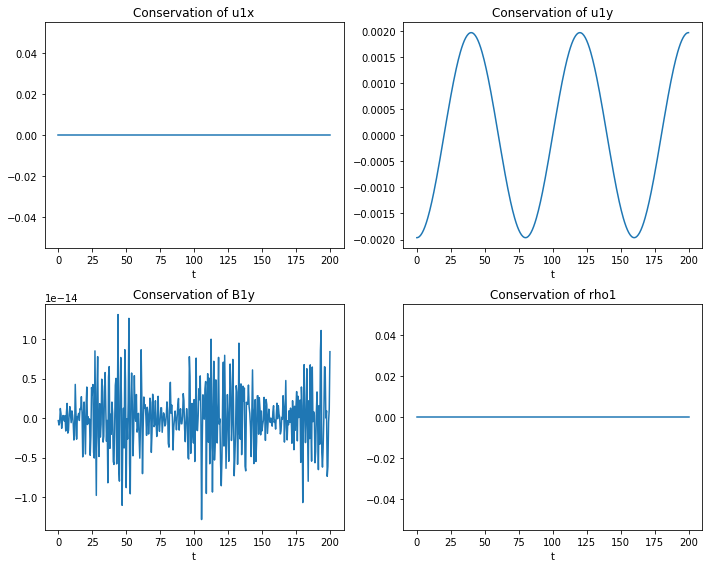

In [9]:
u1x = np.zeros(Nt+1)
u1y = np.zeros(Nt+1)
B1y = np.zeros(Nt+1)
rho1 = np.zeros(Nt+1)

for i in range(0,Nt+1):
    u1x[i] = deltax*sum(Test[:,0,i])
    u1y[i] = deltax*sum(Test[:,1,i])
    B1y[i] = deltax*sum(Test[:,4,i])
    rho1[i] = deltax*sum(Test[:,6,i])

f2, ((a1,a2),(a3,a4)) = plt.subplots(2,2)
f2.set_figheight(8)
f2.set_figwidth(10)
a1.plot(t,np.gradient(u1x,deltat))
a1.set_xlabel('t')
a1.set_title('Conservation of u1x')

a2.plot(t,np.gradient(u1y,deltat))
a2.set_xlabel('t')
a2.set_title('Conservation of u1y')

a3.plot(t,np.gradient(B1y,deltat))
a3.set_xlabel('t')
a3.set_title('Conservation of B1y')

a4.plot(t,np.gradient(rho1,deltat))
a4.set_xlabel('t')
a4.set_title('Conservation of rho1')

plt.tight_layout()
plt.subplots_adjust(wspace = 0.2, hspace = 0.25)

# Check boundary conditions (Dirichlet)

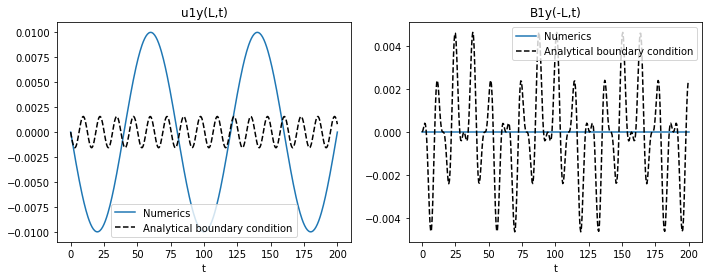

In [10]:
f2, (a1,a2) = plt.subplots(1,2)
f2.set_figheight(4)
f2.set_figwidth(10)

a1.plot(t,Test[-1,1,:],label = 'Numerics')
a1.plot(t,d_R(t)[1],'k--',label = 'Analytical boundary condition')
a1.set_title('u1y(L,t)')
a1.set_xlabel('t')
a1.legend()
     
a2.plot(t,Test[0,4,:],label = 'Numerics')
a2.plot(t,d_L(t)[4],'k--',label = 'Analytical boundary condition')
a2.set_title('B1y(-L,t)')
a2.set_xlabel('t')
a2.legend()

plt.tight_layout()

# Check boundary conditions (Neumann)

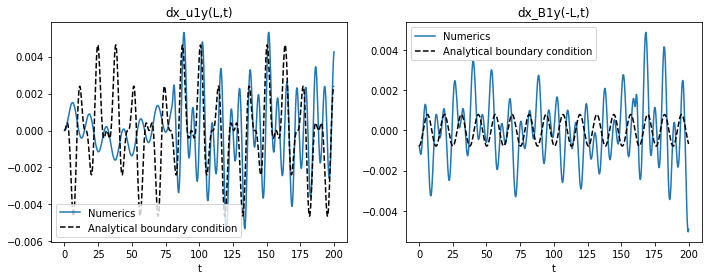

In [6]:
f2, (a1,a2) = plt.subplots(1,2)
f2.set_figheight(4)
f2.set_figwidth(10)

a1.plot(t,(Test[-1,1,:]-Test[-2,1,:])/deltax,label = 'Numerics')
a1.plot(t,n_R(t)[1],'k--',label = 'Analytical boundary condition')
a1.set_title('dx_u1y(L,t)')
a1.set_xlabel('t')
a1.legend()
     
a2.plot(t,(Test[1,4,:]-Test[0,4,:])/deltax,label = 'Numerics')
a2.plot(t,n_L(t)[4],'k--',label = 'Analytical boundary condition')
a2.set_title('dx_B1y(-L,t)')
a2.set_xlabel('t')
a2.legend()

plt.tight_layout()